In [1]:
%config Completer.use_jedi = False
import scanpy as sc
import pandas as pd
sc.set_figure_params(dpi = 150)
from matplotlib import pyplot as plt
import seaborn as sns
import os

import matplotlib.pyplot as plt
import matplotlib as mpl

%matplotlib inline
params = {
    'font.size': 12,
    'axes.titlesize': 12,
    'axes.labelsize': 12,
    'legend.fontsize': 12,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'font.family': "Helvetica",
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
    'figure.dpi': 300
   }
mpl.rcParams.update(params)
SMALL_SIZE = 20
MEDIUM_SIZE = 22
BIGGER_SIZE = 24
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
sns.set_style("ticks")
sns.set_palette('colorblind')

savefig_args = {"dpi": 300, "bbox_inches": "tight", "pad_inches": 0.05}
mpl.rc('savefig', dpi=300)
# create a color dictionary for tissues
def tissue_colors():
    
    tissue_color_dict = {'Bladder': '#e7969c',
             'Blood': '#d6616b',
             'Bone_Marrow': '#cedb9c',
             'Eye': '#c7ea46',#"#00ff7f",
             'Fat': '#e7cb94',
             'Heart': '#ff0800',
             'Kidney': '#7b4173',
             'Large_Intestine': '#31a354',
             'Liver': '#000080',
             'Lung': '#3182bd',
             'Lymph_Node': '#8c6d31',
             'Mammary':'#ce6dbd',
             'Muscle': '#e7ba52',
             'Pancreas': '#fd8d3c',
             'Prostate':'#637939',#'#a55194',#
             'Salivary_Gland':'#622a0f',
             'Skin': '#de9ed6',
             'Small_Intestine': '#6baed6',
             'Spleen': '#393b79',
             'Thymus': '#9c9ede',
             'Tongue':'#b5cf6b',
             'Trachea': '#969696',
             'Uterus':'#c64b8c',#'#ff0090',
             'Vasculature': '#843c39'}
    
    return tissue_color_dict



def _pp(adata, log, normalize, use_dissociation):
    if normalize:
        sc.pp.normalize_total(adata)
    if log:
        sc.pp.log1p(adata, chunk_size=20000)
        adata.raw = adata 

    if use_dissociation:
        dissociation_genes = pd.read_csv('../../metadata/SuppTab5_GenesAffectedByDissociation.tsv')
        adata.var['not_dissociation_gene'] = ~adata.var.index.isin(dissociation_genes.iloc[:,0])
        #adata = adata[:, adata.var.not_dissociation_gene == True]
    return adata





tissue_colors_dictionary = tissue_colors()


In [32]:
# potential command line args
h5ad = '/home/michaelswift/repos/shared_data/TSP/tabula_sapiens.h5ad'
cell_type = 'monocyte'
label = 'tissue'

In [33]:
adata = sc.read_h5ad(h5ad, backed='r+')

In [34]:
adata.obs.loc[:,'mi_ontology'] = adata.obs.cell_ontology_class.map({'b cell': 'memory b cell'})

adata.obs.loc[:,'mi_ontology'] = adata.obs.loc[:,'mi_ontology'].fillna(adata.obs.cell_ontology_class)

cell_label = 'mi_ontology'


In [35]:
# subset to circulating cell types
cell_types_in_Blood = adata.obs.groupby(label)[cell_label].value_counts().xs('Blood')
circulating_cell_types = cell_types_in_Blood[cell_types_in_Blood > 30].index
adata = adata[(adata.obs.mi_ontology == cell_type)]

In [36]:
adata = adata.to_memory()

In [37]:
_sub_adata = adata
print("{} {} in the dataset".format(_sub_adata.obs.shape[0], cell_type))

12524 monocyte in the dataset


In [38]:
# subset to tissues with more than 10 cells detected in this class
# for reasonable differential epxression comparison
_df = pd.DataFrame(_sub_adata.obs.groupby(label)[cell_label].value_counts() > 10)
_tissues = _df[_df[cell_label] == True].unstack().index.to_list()
_sub_adata = _sub_adata[_sub_adata.obs.tissue.isin(_tissues)]
print("{} {} in the dataset {}".format(_sub_adata.obs.shape[0], cell_type, "after filtering out low abundance tissues"))

12520 monocyte in the dataset after filtering out low abundance tissues


In [39]:
print("performing differential expression analysis")
min_fold_change = 0.8
# uses t-test for speed, but wilcoxon is the more appropriate test I'm told
sc.tl.rank_genes_groups(_sub_adata, groupby=label)
sc.tl.filter_rank_genes_groups(_sub_adata, min_fold_change=0.8)
print("filtered genes by min fold change {}".format(min_fold_change))

performing differential expression analysis


/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/anndata/_core/anndata.py:1236: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'mi_ontology' as categorical


filtered genes by min fold change 0.8


In [40]:
sc.pl.rank_genes_groups(_sub_adata)

In [41]:
result = _sub_adata.uns['rank_genes_groups_filtered']
groups = result['names'].dtype.names
gene_df = pd.DataFrame(
    {group + '_' + key[:]: result[key][group]
     # Get Each Clusters 10 top Genes
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})

/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list inste

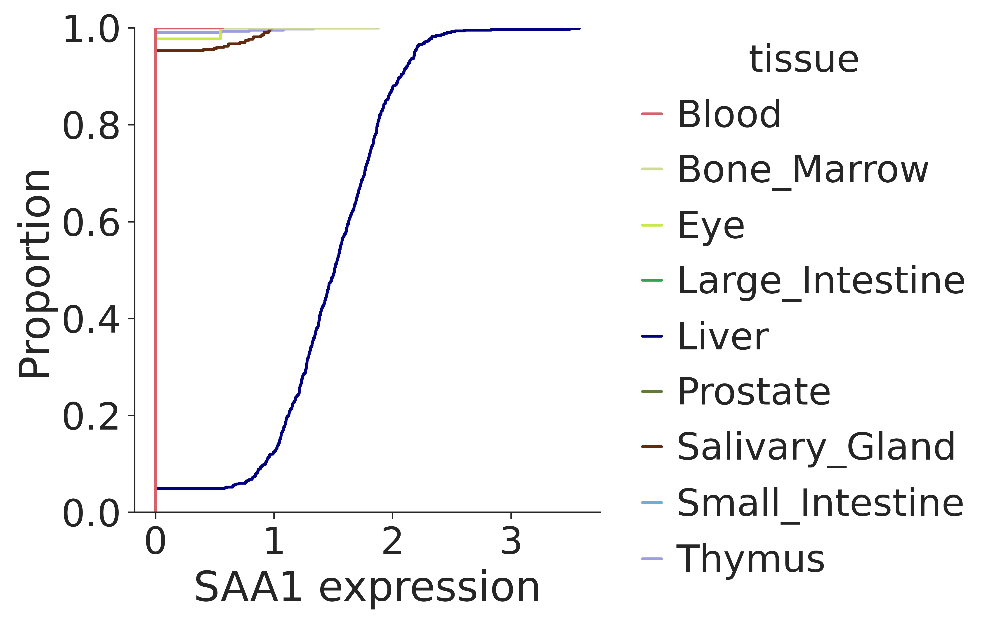

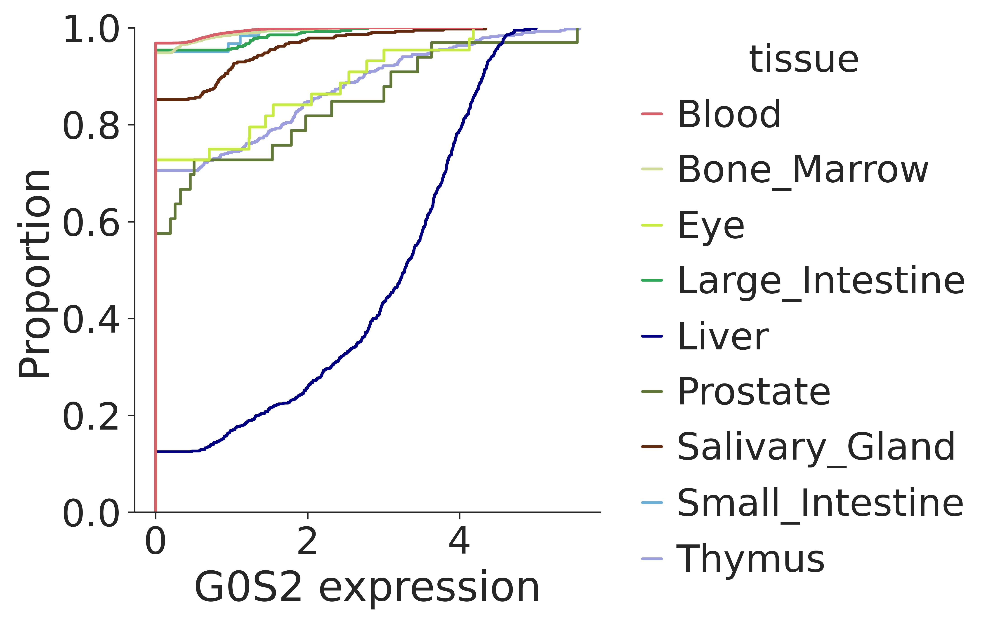

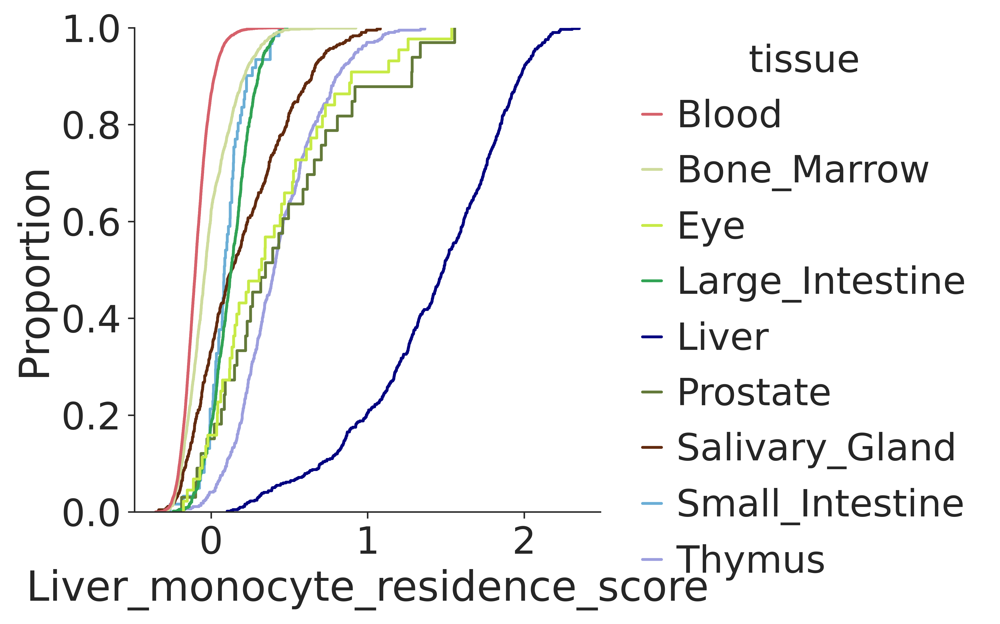

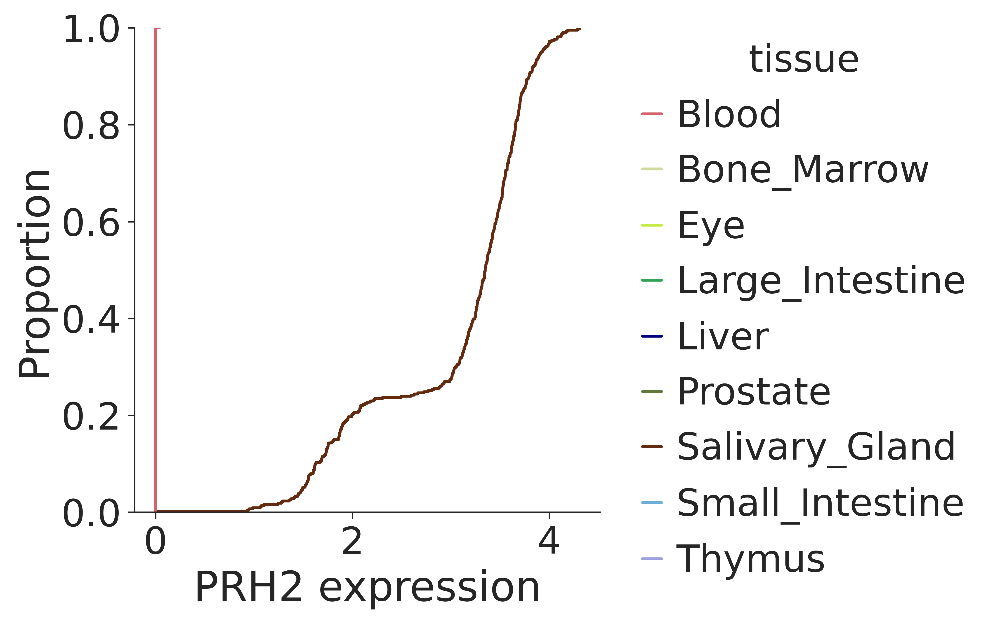

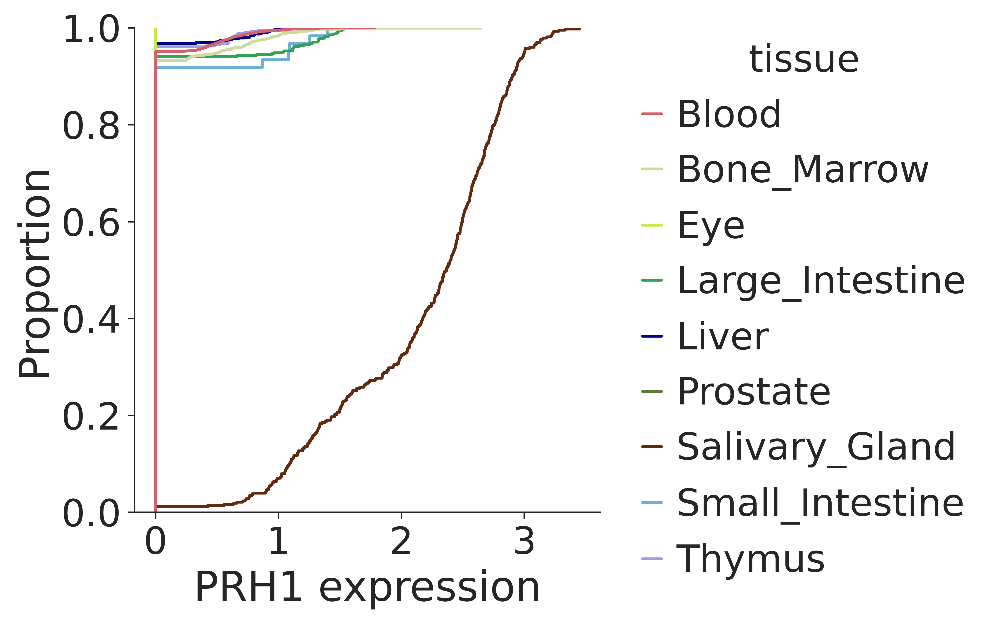

...

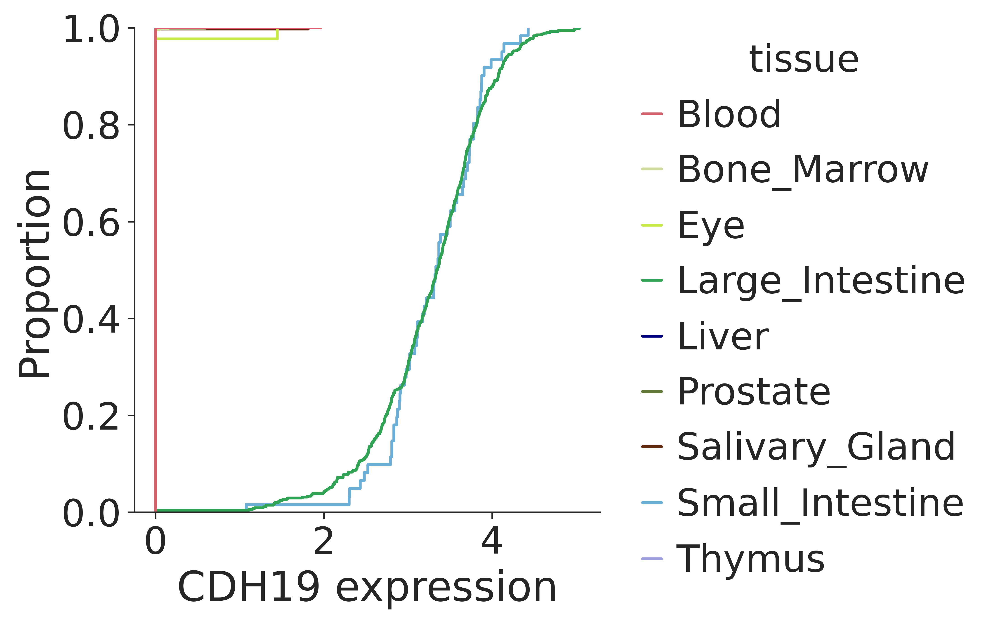

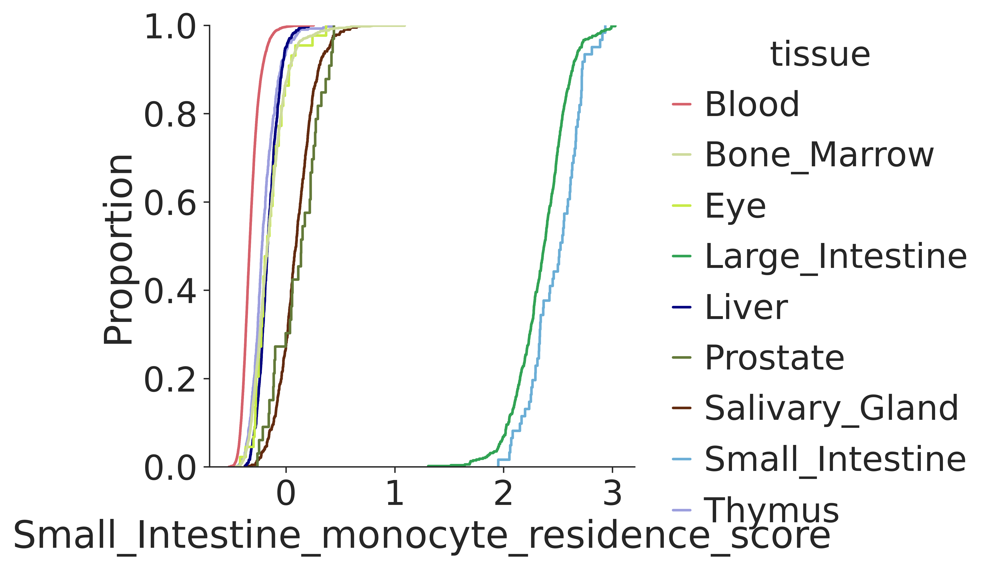

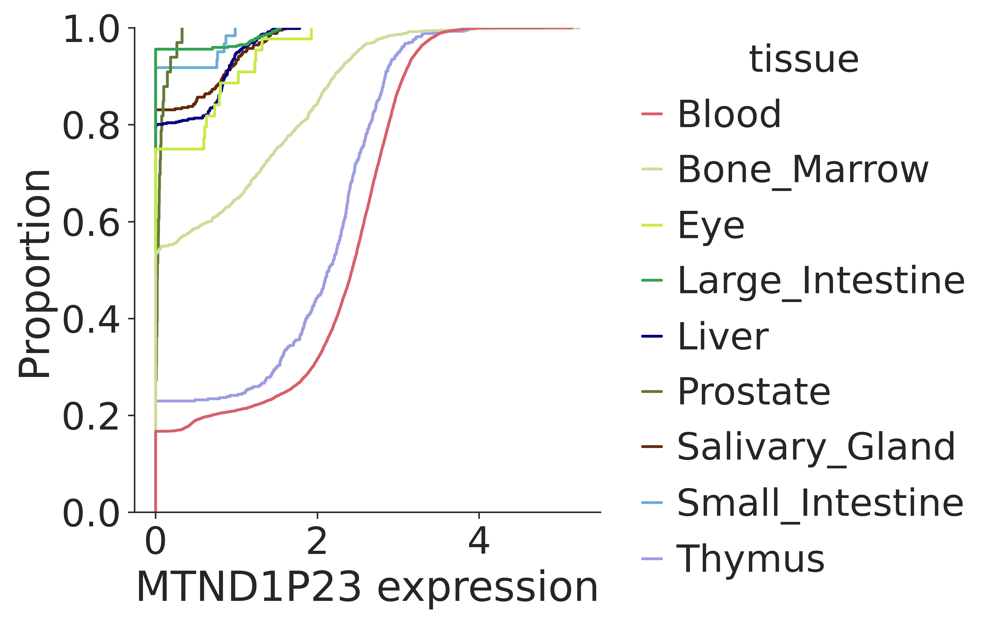

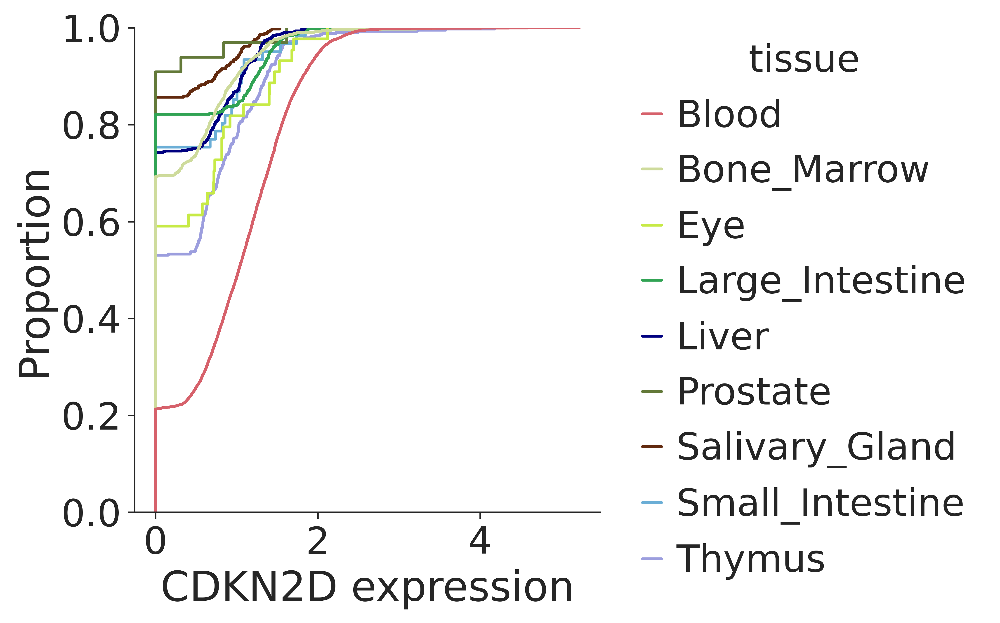

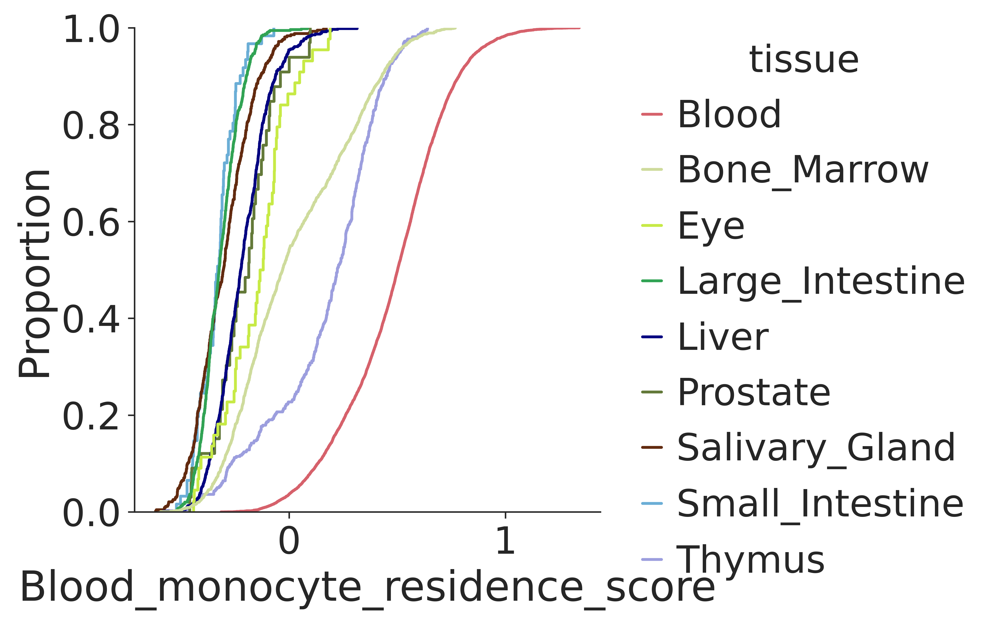

In [42]:
holo_gene_set = []
num_genes = 20
result = _sub_adata.uns['rank_genes_groups_filtered']
groups = result['names'].dtype.names
gene_df = pd.DataFrame(
    {group + '_' + key[:]: result[key][group]
     # Get Each Clusters 10 top Genes
    for group in groups for key in ['names', 'pvals']})


#iterate thru the unique tissues
for tis in _sub_adata.obs[label].unique():

    # reset rank genes df for new organ
    _gene_df = gene_df.copy()
     # Drop the filtered genes
    _gene_df = _gene_df[[tis + '_names', tis + '_pvals']].dropna()
    gene_list = _gene_df[tis + '_names'].to_list()
    genes = gene_list
    holo_gene_set.append(gene_list)
    score_name = tis + '_' + cell_type + "_residence_score"
    sc.tl.score_genes(_sub_adata, gene_list = gene_list[:num_genes], score_name = score_name, use_raw = False)
    plotdf = sc.get.obs_df(
            _sub_adata,
            keys=genes + [label, score_name])
    for gene in genes[:2]:
        g = sns.displot(data = plotdf, x = gene, hue = label, kind='ecdf', palette=tissue_colors_dictionary
                   )
        g.set_titles(cell_type)
        g.set_xlabels(gene + ' expression')
        directory = 'figures/{}_specific/{}_{}/'.format(label, cell_type, tis)
        if not os.path.exists(directory):
            os.makedirs(directory)
        g.savefig('figures/{}_specific/{}_{}/{}.pdf'.format(label, cell_type, tis, gene))
    g = sns.displot(data = plotdf, x=score_name, hue = label, kind = 'ecdf', palette=tissue_colors_dictionary )
    g.savefig('figures/{}_specific/{}.pdf'.format(label, score_name))

# Save Results

In [43]:
flat_list = [item for sublist in holo_gene_set for item in sublist]
pd.DataFrame(flat_list).to_csv("{}/{}_{}".format('degs', cell_type, 'tissue_distinguishing_genes.csv.gz'))

## Re load the data and perform other types of analyses

In [44]:
import pandas as pd
cell_type = 'neutrophil'
df = pd.read_csv("{}/{}_{}".format('degs', cell_type, 'tissue_distinguishing_genes.csv.gz'), index_col=0)

# PCA

In [45]:
gene_set = df.iloc[:,0]
adata = sc.read_h5ad(h5ad, backed='r+')

adata = adata[adata.obs.cell_ontology_class == cell_type]

adata = adata.to_memory()
# These tissues seemed to have mostly artefactual results due to a lot of ambient RNA
adata = adata[~adata.obs.tissue.isin(['Salivary_Gland', 'Heart', 'Eye'])]

subset = True 
if subset:
    adata = adata[:,adata.var.index.isin(gene_set)]



In [ ]:
#sc.pp.scale(adata)

sc.pp.pca(adata)

sc.pl.pca_overview(adata, color = ['tissue'], projection = '2d', size = 3)

In [ ]:
sc.pl.correlation_matrix(adata, groupby='tissue', cmap = 'viridis')